In [1]:
import sklearn
from sklearn.model_selection import train_test_split
import numpy as np
import shap
import pandas as pd
import numpy as np
from nltk.corpus import wordnet as wn
from sklearn import model_selection, naive_bayes, svm, linear_model
from sklearn.metrics import accuracy_score
from helper import read_imdb_split,download_data
from tf_idf import build_tf_idf
from sklearn.pipeline import Pipeline
np.random.seed(1337)
shap.initjs()

/Users/johanneswidera/Uni/bachelorarbeit/Code/hugging-face/HUGGING_ENV/lib/python3.9/site-packages/shap/utils/_clustering.py:35: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def _pt_shuffle_rec(i, indexes, index_mask, partition_tree, M, pos):
/Users/johanneswidera/Uni/bachelorarbeit/Code/hugging-face/HUGGING_ENV/lib/python3.9/site-packages/shap/utils/_clustering.py:54: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-

In [2]:
import os
import numpy as np

if not os.path.exists("/Sentiment"):
    os.chdir("..")

# 1. Get Training Data 

In [3]:
download_data()
texts, labels = read_imdb_split('../data/aclImdb/train')


In [4]:
corpus_train, corpus_test, y_train, y_test = train_test_split(texts,labels,test_size=0.2)

# 2. Build Vectorizer

In [5]:
vectorizer_tf_idf = build_tf_idf()
vectorizer_tf_idf.fit(corpus_train)

TfidfVectorizer(max_df=0.99, min_df=0.001)

# 3. Build Models

# 3.1 Build Logistic Regression Model

In [6]:
from PipelineWrapper import PipelineWrapper
model = linear_model.LogisticRegression(penalty="l2")
model_logregression_new = PipelineWrapper(model, vectorizer_tf_idf, corpus_test, corpus_train, y_test, y_train)

In [7]:
model_logregression_new.fit()

In [8]:
model_logregression_new.report()

,0,1,accuracy,macro avg,weighted avg
precision,0.901373,0.883327,0.892,0.892350,0.892238
recall,0.877278,0.906361,0.892,0.891820,0.892000
f1-score,0.889163,0.894696,0.892,0.891929,0.891963
support,2469.000000,2531.000000,0.892,5000.000000,5000.000000


# 3.2 Build Decision Tree Classifier

In [9]:
from sklearn.tree import DecisionTreeClassifier


model_dtc = PipelineWrapper(DecisionTreeClassifier(), vectorizer_tf_idf, corpus_test, corpus_train, y_test, y_train)

In [10]:
model_dtc.fit()

In [11]:
model_dtc.report()

,0,1,accuracy,macro avg,weighted avg
precision,0.696394,0.722016,0.7088,0.709205,0.709364
recall,0.727420,0.690636,0.7088,0.709028,0.708800
f1-score,0.711569,0.705977,0.7088,0.708773,0.708738
support,2469.000000,2531.000000,0.7088,5000.000000,5000.000000


# 4 Analyze With SHAP

We know that the Logistic Regression Performs better than the Decision Tree Classifier.
To further investigate why thats the case we need to look into the models.

In the following i will do 3 things.

Per Model:
1. Most Positive/Negative Words
2. Investigate the Most Wrong Positive and Negative prediction

Model Comparision:
1. Investigate biggest Prediction gap accross the models

In [12]:
def make_predictions(X_batch_text):
    X_batch = vectorizer_tf_idf.transform(X_batch_text)
    preds = model_logregression_new.predict_proba(X_batch)
    return preds


In [13]:
masker = shap.maskers.Text(tokenizer=r"\W+") # this will create a basic whitespace tokenizer
# explainer_logreg = shap.Explainer(model_logregression_new.predict_proba , masker)
explainer_logreg = shap.Explainer(model_logregression_new.predict_proba, masker)

In [14]:
shap_values = explainer_logreg(corpus_test)

Partition explainer: 5001it [18:08,  4.55it/s]                            


In [33]:
print(shap_values)

.values =
array([array([[ 7.32445382e-04, -7.32445382e-04],
              [ 7.32445382e-04, -7.32445382e-04],
              [-3.02159408e-03,  3.02159408e-03],
              [-3.02159408e-03,  3.02159408e-03],
              [-1.26273981e-01,  1.26273981e-01],
              [-1.08078219e-02,  1.08078219e-02],
              [ 3.34026292e-03, -3.34026292e-03],
              [ 3.34026292e-03, -3.34026292e-03],
              [ 1.37075422e-03, -1.37075422e-03],
              [ 1.37075422e-03, -1.37075422e-03],
              [ 1.37075422e-03, -1.37075422e-03],
              [ 1.37075422e-03, -1.37075422e-03],
              [ 1.77182823e-03, -1.77182823e-03],
              [ 1.77182823e-03, -1.77182823e-03],
              [ 1.77182823e-03, -1.77182823e-03],
              [ 1.77182823e-03, -1.77182823e-03],
              [ 1.77182823e-03, -1.77182823e-03],
              [-3.10025193e-02,  3.10025193e-02],
              [ 2.74263138e-02, -2.74263138e-02],
              [ 3.07903995e-02, -3.07903

### 4.1 Investigate the biggest misclassification


In [34]:
y_prob_test = model_logregression_new.predict_proba(corpus_test) # with probabilites
y_predict_test = model_logregression_new.predict(corpus_test) # with labels 1 and 2

In [35]:
y_prob_test_np = np.array(y_prob_test)
y_predict_test_np = np.array(y_predict_test)
y_test_np = np.array(y_test)

In [36]:
wrong_positive_indexes = np.where((y_test_np == 1) & (y_predict_test_np != y_test_np))[0]
print("Wrong Positive Indexes: ",wrong_positive_indexes.size)

wrong_negative_indexes = np.where((y_test_np == 0) & (y_predict_test_np != y_test_np))[0]
print("Wrong Negative Indexes: ",wrong_negative_indexes.size)

most_wrong_positive_index = wrong_positive_indexes[np.argmax(y_prob_test_np[wrong_positive_indexes,1])]
most_wrong_negative_index = wrong_negative_indexes[np.argmax(y_prob_test_np[wrong_negative_indexes,0])]

Wrong Positive Indexes:  237
Wrong Negative Indexes:  303


#### 4.1.2 Most Wrong Positive Classification

Most wrong review 

In [37]:
print(corpus_test[most_wrong_positive_index])
print("Real Label: ", y_test[most_wrong_positive_index])
print("Predicted Label: ", y_predict_test[most_wrong_positive_index])
print("Predicted Probability Label: ", y_prob_test[most_wrong_positive_index])

I rented this movie simply because Rosario Dawson was in it. I sat down to watch it with my buddy and 6 minutes in we were glued to our seats. Not because of any intensity in those 6 minutes, but because it was a real film. No Hollywood BS, no explosions, no corny one liners; film. It drew you in slowly, reeling you toward a tragically human fate. Some people think they enjoy film but they are sadly mistaken. They like movies; mindless entertainment for entertainment's sake alone. Michael Bay's Transformers and the like were produced for just this audience. No need to think people, just watch and allow ever stereotype we can muster to slowly dissolve your brain. We'll even place advertisements throughout the movie, to keep you buying our products. And don't forget the explosions, we all love explosions. Here we make the distinction, art can be entertaining, but it's also thought provoking and moves you in hidden ways. Entertainment is rarely artful and even then only arbitrarily. Movie

so its 0.5 behind the real label.
But Why lets investigate

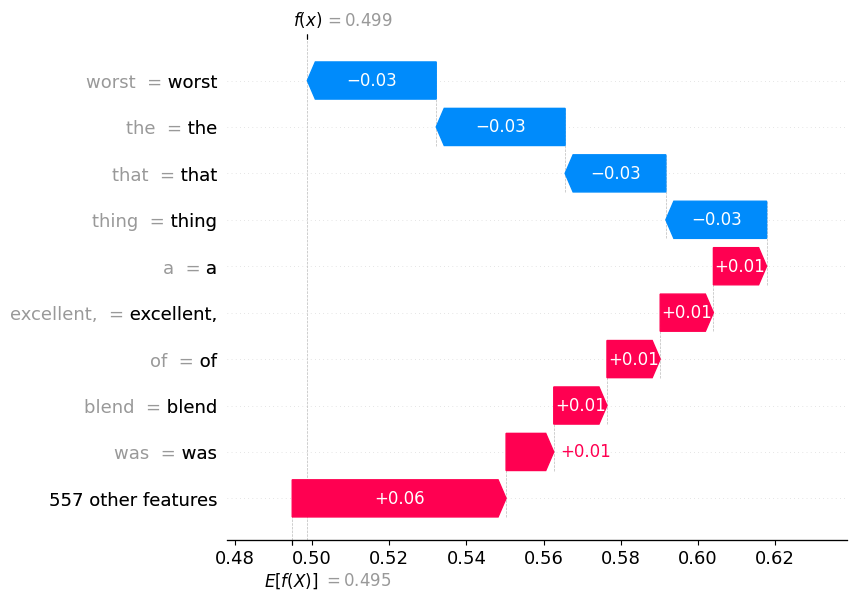

In [38]:
shap.plots.text(shap_values[most_wrong_positive_index])
shap.plots.waterfall(shap_values[most_wrong_positive_index, :, 1])

# interpretation:
It was almost an positive review with a score of 0.7 but Even and predictable had such an high impact on the result.

#### 4.1.2 Most Wrong Negative Classification

Most wrong review 

In [39]:
print(corpus_test[most_wrong_negative_index])
print("Real Label: ", y_test[most_wrong_negative_index])
print("Predicted Label: ", y_predict_test[most_wrong_negative_index])
print("Predicted Probability Label: ", y_prob_test[most_wrong_negative_index])

Haunted Boat sells itself as 'The Fog' meets 'Open Water'. In many ways this is accurate. There are scares and weird looking people to keep you interested.<br /><br />However the acting ability is poor at best. Showing clear signs that this is merely a bunch of friends making a horror film. Which in all credit they do to the best of their ability. When you accept the low budget makes it very difficult for special effects, with the ghosts looking pretty much like men with rubber masks on.<br /><br />Many aspects of the film are creepy and strange. But it suffers for using too many twists and turns in a short space of time which just leaves you bored and confused. In terms of keeping you awake the film does it very well. Ignoring the irrelevant twisting every 5 seconds near the end, you actually want to know what is going on. And are willing to wait the 1hr 35 minutes for the climax.<br /><br />This is no Ghost Ship but it'll definitely do for an evening in front of the T.V.
Real Label: 

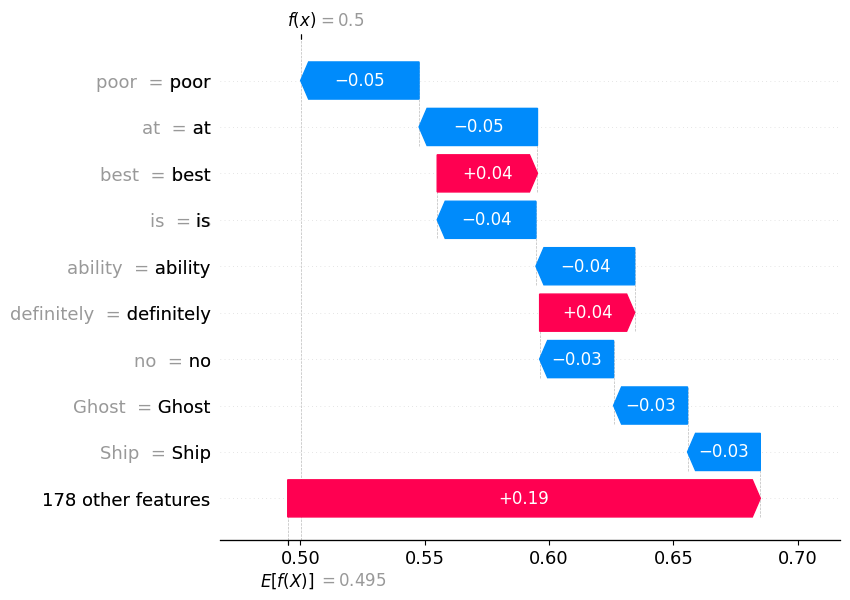

In [40]:
shap.plots.text(shap_values[most_wrong_negative_index])
shap.plots.waterfall(shap_values[most_wrong_negative_index, :, 1])

# Interpretation:

The 10 was learned as something positive but the whole sentence is 2/10
so it should be positive.
This can give us a hint for better Tokenization.


# 4.2 Global Interpretation Most Positive and negative Words

To understand how the model works

In [41]:
values = shap_values[:,:,1].values
feature_names = shap_values[:,:,1].feature_names  
all_features = model_logregression_new.get_feature_names()


data = []

for i,(row_values,row_features) in enumerate(zip(values, feature_names)):
    row_dict = {}
    for j,value in enumerate(row_values):
        word = row_features[j]
        #word_index = np.where(all_features == word)[0][0]
        row_dict[word] = value
    data.append(row_dict)

len(data)
df = pd.DataFrame(data)
df = df.fillna(0)
        


Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


In [42]:
df 

,Six,Degrees,is,a,wonderful,show!,I,watched,the,entire,...,Ranyaldo,Leartes.,"digger,","Marcellous,",soliloquy (,applauding.<,enjoy',Shakespeares,Scream-,mask?
0,0.006605,0.006605,-0.000770,0.029477,0.040699,0.010808,0.001447,-0.00334,-0.000298,-0.001371,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000854,0.003937,0.000000,0.000000,0.000481,0.00000,0.000481,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,-0.005328,0.011263,0.000000,0.000000,0.000000,0.00000,0.008432,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,-0.011138,-0.000677,0.000000,0.000000,-0.007246,0.00000,-0.004650,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,-0.001950,0.013049,0.000000,0.000000,0.002688,0.00000,-0.010189,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.000000,0.000000,-0.000802,-0.004330,0.000000,0.000000,-0.001806,0.00000,0.000921,0.007373,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4996,0.000000,0.000000,0.000906,0.007803,0.000000,0.000000,0.000000,0.00000,-0.007350,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4997,0.000000,0.000000,0.001255,-0.000186,0.000000,0.000000,-0.000169,0.00000,-0.006059,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4998,0.000000,0.000000,0.000084,0.001684,0.000000,0.000000,0.000000,0.00000,0.000538,-0.007454,...,-0.001453,-0.000474,-0.000235,0.012412,-0.000854,-0.000374,0.030875,0.012336,0.000000,0.000000


In [43]:
positive_impact = df.apply(lambda x:  x[x > 0].mean(), axis=0).sort_values(ascending=False)[:10]
negative_impact = df.apply(lambda x:  x[x < 0].mean(), axis=0).sort_values(ascending=True)[:10]

In [44]:
features = model_logregression_new.get_feature_names()

with open('your_file_new.txt', 'w') as f:
    for feature in features:
        f.write("%s\n" % feature)

In [45]:
positive_impact

GREAT!!! ****    0.149372
Touching;        0.140899
Recommended!     0.133827
great".          0.128431
JOB              0.100897
superb. <        0.095894
Ramones,         0.090319
Great,           0.089057
traditional-     0.088666
fun (            0.084407
dtype: float64

In [46]:
negative_impact

worst/            -0.331042
bad /             -0.219269
mess!!            -0.154020
awful (           -0.147474
nothing:          -0.147316
horrible)         -0.144279
Worst.            -0.143373
disappointment!   -0.132505
TERRIBLE.         -0.118310
boring! "         -0.114803
dtype: float64

<BarContainer object of 10 artists>

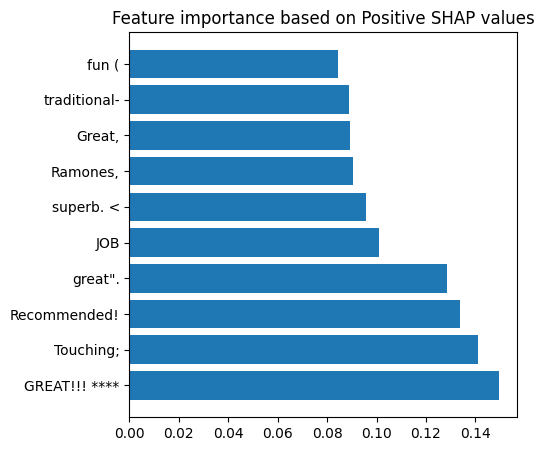

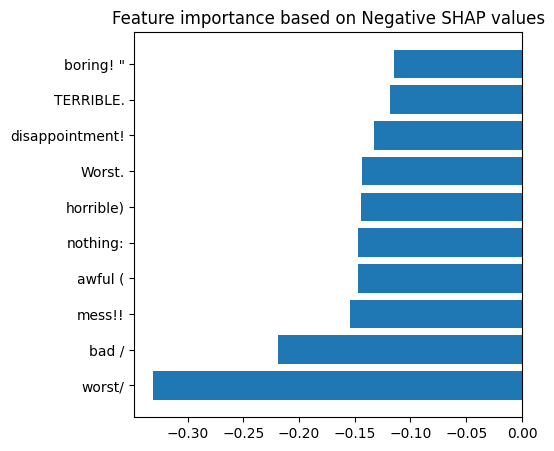

In [29]:
import matplotlib.pyplot as plt
# plot the mean absolute value of the features
plt.figure(figsize=(5, 5))
plt.title("Feature importance based on Positive SHAP values")
plt.barh(positive_impact.index, positive_impact.values)
plt.figure(figsize=(5, 5))
plt.title("Feature importance based on Negative SHAP values")
plt.barh(negative_impact.index, negative_impact.values)

### 4.3 Just for Fun Construct example

In [30]:
text = "funniest great movie ever"

model_logregression_new.predict_proba([text])

array([[0.01364439, 0.98635561]])

In [31]:
text = "funniest great worst/ movie ever"
model_logregression_new.predict_proba([text])

array([[0.53666965, 0.46333035]])